In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

def animate_path(Datax, Datay, x_input, y_input, anim_frames, anim_interval):

    '''
    Inputs
    --------
    Data (array_like) - must be 2d, data points
    desc_x (array_like)- must be 2d, locations of final decision variables
    clusterID (array_like) - cluster assignments 
    anim_frames (int) - number of frames for animation 
    anim_interval (int) - controls speed of animation?
    x_input
    y_input
    '''

    ##Animate paths###
    fig, ax = plt.subplots()
    ax.plot(Datax, Datay)
    scat = ax.scatter([],[], c = 'r')

    def init():
        scat.set_offsets([])
        return scat, 

    # animation function.  This is called sequentially
    def animate(i):
        x = x_input[i]
        y = y_input[i]
        data = np.vstack((x,y))
        scat.set_offsets(data.T)
        
        return scat,

    anim = animation.FuncAnimation(fig, animate, init_func=init,
                                   frames= anim_frames, interval=anim_interval, blit=True)

    return HTML(anim.to_jshtml()) 

A function is convex when all local minima are global minima

e.g. $f(x) = x^2$ is a convex function with a global minimum at $(0,0)$

A non-convex function might have multiple local minima that are not the global minimum.

Text(0.5, 1.0, 'Nonconvex Function')

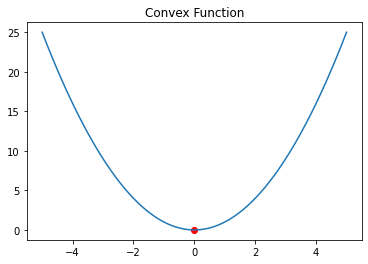

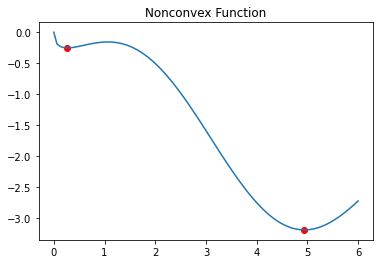

In [45]:
y = lambda x:x**2
xvals = np.linspace(-5,5,100)

plt.figure()
plt.plot(xvals, y(xvals))
plt.scatter([0], [0], c = 'r')
plt.title('Convex Function')

y2 = lambda x: np.sin(x) - x**(1/2)
xvals2 = np.linspace(0, 6, 100)

plt.figure()
plt.plot(xvals2, y2(xvals2))
plt.scatter([.269, 4.939], [-.253, -3.197], c = 'r')
plt.title('Nonconvex Function')


# Gradient Descent

Initialize $w_0$

for $t = 1,2, \cdots$

$w_{t+1} = w_t - \eta \nabla f(w_t)$



In [380]:
def xsquared(x):
    return x**2

def xsquared_grad(x):
    return 2*x

def grad_descent(winit, f, fgrad, **kwargs):
    
    tol = kwargs.pop('tolerance', 1e-6)
    step_size = kwargs.pop('step_size', .1)
    
    err = tol +1 
    wold = winit
    
    w_hist = []
    y_hist = []
    
    max_iter = 200
    iter_count = 0
    
    while err>tol:
        wnew = wold - step_size*fgrad(wold)
                
        w_hist.append(wold)
        y_hist.append(f(wold))
    
        err = np.abs(wnew - wold)
                        
        wold = wnew
        
        iter_count+=1
        
        if iter_count>=max_iter:
            return wnew, w_hist, y_hist
        
    return wnew, w_hist, y_hist
    


Recall: gradient descent update
    
$w_{t+1} = w_t - \eta \nabla f(w_t)$



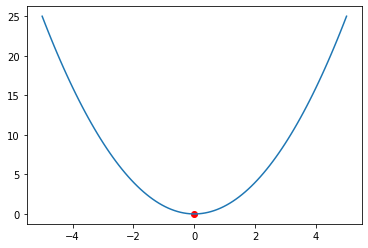

In [381]:
min_x, x_hist, y_hist = grad_descent(-5, xsquared, xsquared_grad, tolerance = 1e-16)

min_y = xsquared(min_x)

xvals = np.linspace(-5,5,100)

yvals = xsquared(xvals)

animate_path(xvals, yvals, x_hist, y_hist, len(x_hist), 300)


In [382]:
print('The calculated minimum is: ', min_x, min_y)

The calculated minimum is:  -3.273390607896145e-16 1.0715086071862694e-31


Recall: gradient descent update
    
$w_{t+1} = w_t - \eta \nabla f(w_t)$




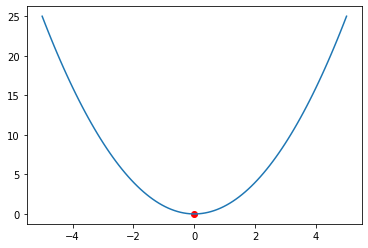

In [70]:
min_x, x_hist, y_hist = grad_descent(2, xsquared, xsquared_grad)

min_y = xsquared(min_x)

xvals = np.linspace(-5,5,100)

yvals = xsquared(xvals)

animate_path(xvals, yvals, x_hist, y_hist, len(x_hist), 300)



What if my step size $\eta$ is too large?

$w_{t+1} = w_t - \eta \nabla f(w_t)$



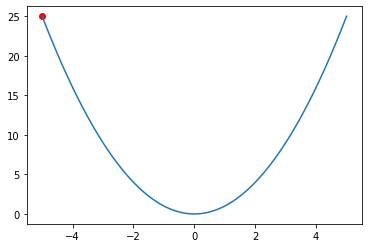

In [373]:
min_x, x_hist, y_hist = grad_descent(5, xsquared, xsquared_grad, step_size = 1, tolerance = 1e-6)

min_y = xsquared(min_x)

xvals = np.linspace(-5,5,100)

yvals = xsquared(xvals)

animate_path(xvals, yvals, x_hist, y_hist, len(x_hist), 300)




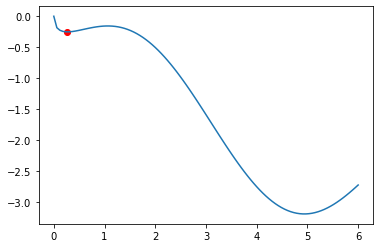

In [378]:
def func(x):
    return np.sin(x) - x**(1/2)

def func_grad(x):
    return np.cos(x) - 1/2*x**(-1/2)

xvals = np.linspace(0, 6, 100)

min_x, x_hist, y_hist = grad_descent(.01, func, func_grad, step_size = .01)

min_y = func_grad(min_x)

yvals = func(xvals)

animate_path(xvals, yvals, x_hist, y_hist, len(x_hist), 400)

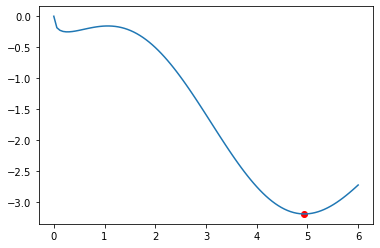

In [81]:
xvals = np.linspace(0, 6, 100)

min_x, x_hist, y_hist = grad_descent(3, func, func_grad)

min_y = func_grad(min_x)

yvals = func(xvals)

animate_path(xvals, yvals, x_hist, y_hist, len(x_hist), 400)

You can run gradient descent, whether your objective is convex or not, but you are only guaranteed to reach the global minimum if your function is convex and your step size is small enough. 

# Gradient Descent for machine learning

Given data $\{(x_i, y_i)\}_{i=1}^n$, $x_i \in \mathbb{R}^d$ and $y_i \in \mathbb{R}$,

Gradient descent: 

$w_{t+1} = w_t - \eta \nabla_w \bigg(\frac{1}{n} \sum_{i=1}^n l_i(w) \bigg)|_{w = w_t}$

where $l_i(w)$ is the loss function

Text(0.5, 1.0, 'Data For Linear Fit')

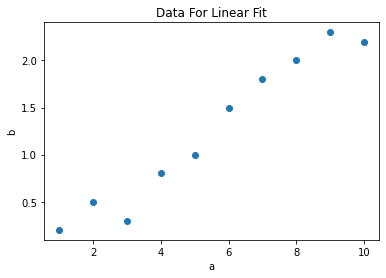

In [95]:
# Generate Data
x = np.arange(1,11)
y = np.array([0.2, 0.5, 0.3, 0.8, 1.0, 1.5, 1.8, 2.0, 2.3, 2.2])


plt.figure()
plt.scatter(x,y)
plt.xlabel('x')
plt.ylabel('y')
plt.title('Data For Linear Fit')


Let's try to find the line of best fit by minimizing the $E_2$ error. 

$L = \frac{1}{n} \sum_{k=1}^n |f(x_k) - y_k|^2 =\frac{1}{n} \sum_{k=1}^n |ax_k + b - y_k|^2 = $

$= \frac{1}{n} \sum_{k=1}^n |[a,b]\cdot[x_k,1]^T - y_k|^2 = \frac{1}{n}\sum_{k=1}^n |\beta \cdot xnew_k^T - y_k|^2 $

We want to find the vector $\beta = [a,b]$ that give us the best fit

$\nabla_{\beta} L = \frac{2}{n} \sum_{k=1}^n xnew_k \cdot (\beta \cdot xnew_k^T - y_k)$


From notebook 1, we solved that $\beta = [0.25818182, -0.16   ]$

In [146]:
# Redefine x so x_k = [val, 1]

xnew = np.vstack((x, np.ones(10))).T
print(xnew)


[[ 1.  1.]
 [ 2.  1.]
 [ 3.  1.]
 [ 4.  1.]
 [ 5.  1.]
 [ 6.  1.]
 [ 7.  1.]
 [ 8.  1.]
 [ 9.  1.]
 [10.  1.]]


[[ 0.25814824 -0.15976622]]


Text(0, 0.5, 'Obj function value')

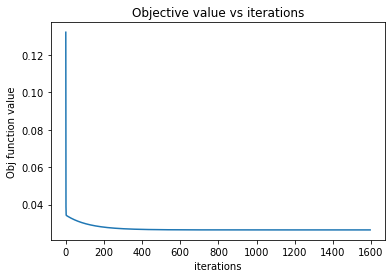

In [357]:
def loss(x,y, beta):
    temp = beta@x.T - y
    return np.sum(np.abs(beta@x.T - y)**2)/len(y)
    
def loss_grad(x,y,beta):   
    grad_sum = np.zeros(2)
    for i in range(len(y)):
        grad_sum += x[i,:, np.newaxis]@(beta@(x[i,:]).T - y[i])
    return grad_sum*2/len(y)

    
def grad_descent2(winit, x, y, f, fgrad, **kwargs):
    
    tol = kwargs.pop('error', 1e-6)
    step_size = kwargs.pop('step_size', .1)
    
    err = 1
    wold = winit
    
    max_iter = 5000
    iter_count = 0
    
    obj_hist = []
    
    while err>tol:        
        wnew = wold - step_size * fgrad(x,y, wold)
                        
        err = np.linalg.norm(wnew - wold,2)
        
        obj_hist.append(f(x,y,wnew))
                        
        np.copyto(wold, wnew)
        
        iter_count+=1
        
        if iter_count>=max_iter:
            print('Reached max number of iterations')
            return wnew, obj_hist
        
    return wnew,obj_hist

beta, obj_hist = grad_descent2(np.zeros((1,2)), xnew, y, loss, loss_grad, step_size = .01)
print(beta)

plt.figure()
plt.title('Objective value vs iterations')
plt.plot(obj_hist)
plt.xlabel('iterations')
plt.ylabel('Obj function value')


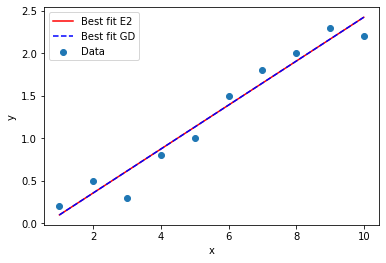

In [326]:
def lineOfBestFit(params, x):
    f = lambda xk: params[0]*xk + params[1]
    
    return f(x)

ypred = lineOfBestFit(beta.T, x)

beta_true = np.array([0.25818182,-0.16])
ytrue = lineOfBestFit(beta_true, x)

plt.figure()
plt.scatter(x,y, label = 'Data')
plt.plot(x,ypred, c = 'r', label = 'Best fit E2')
plt.plot(x, ytrue, '--', c = 'b', label = 'Best fit GD')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()




# Stochastic Gradient Descent

Given data $\{(x_i, y_i)\}_{i=1}^n$, $x_i \in \mathbb{R}^d$ and $y_i \in \mathbb{R}$,

Gradient descent: 

$w_{t+1} = w_t - \eta \nabla_w \bigg(\frac{1}{n} \sum_{i=1}^n l_i(w) \bigg)|_{w = w_t}$

where $l_i(w)$ is the loss function

With gradient descent, you have to calculate $n$ terms to sum together every update

Stochastic Gradient descent:

$w_{t+1} = w_t - \eta \nabla_{w}l_{I_t}(w) |_{w = w_t}$

where $I_t$ is drawn uniformly at random from $k = 1:n$ so that $P(I_t = i) = \frac{1}{n}$

Why does this work? Because the expected value $\mathbb{E}[\nabla l_{I_t}(w)] = \frac{1}{n}\sum_{i=1}^n l_i(w)$

Proof:

Recall the expected value of a random variable $X$ is $\mathbb{E}[X] = \sum_{i=1}^n P(X = x_i) x_i$

$\mathbb{E}[\nabla l_{I_t}(w)] = \sum_{i=1}^n P(I_t = i)\nabla l_i(x) = \sum_{i=1}^n \frac{1}{n} \nabla l_i(x)$

[[ 0.2665917  -0.06614187]]


Text(0, 0.5, 'Obj function value')

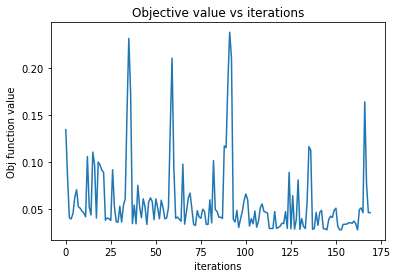

In [349]:
def loss_grad_sgd(x,y,beta):
    i = np.random.randint(0, len(y))
    grad = 2*x[i,:, np.newaxis]@(beta@(x[i,:]).T - y[i])
    return grad


beta, obj_hist = grad_descent2(np.zeros((1,2)), xnew, y, loss, loss_grad_sgd, step_size = .01)
print(beta)

plt.figure()
plt.title('Objective value vs iterations')
plt.plot(obj_hist)
plt.xlabel('iterations')
plt.ylabel('Obj function value')



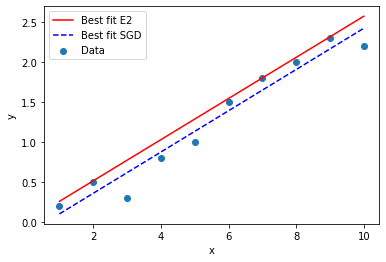

In [347]:
ypred = lineOfBestFit(beta.T, x)

beta_true = np.array([0.25818182,-0.16])
ytrue = lineOfBestFit(beta_true, x)

plt.figure()
plt.scatter(x,y, label = 'Data')
plt.plot(x,ypred, c = 'r', label = 'Best fit E2')
plt.plot(x, ytrue, '--', c = 'b', label = 'Best fit SGD')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()



Let's consider binary classifification on MNIST aka whether a digit is a 2 or a 7.  Let B = 1 for all the 7's in the dataset and B = -1 for all the 2's in the dataset.  We're going to use regularized logistic regression.  Given a binary classification dataset $\{a_i, b_i\}_{i=1}^n$ for $a_i \in \mathbb{R}^d$ and $b_i \in\{-1,1\}$, the regularized negative log likelihood objective function can be written as:

$J(x,y) = \frac{1}{n} \sum_{i=1}^n log\bigg(1 + e^{-b_i(y + a_i^Tx)}\bigg) + \lambda ||x||_2^2$

The derivative of $||x||^2  = \sum_{k=1}^d |x_k|^2$ is $2x$

The derivative with respect to $x_k$ is going to be $2|x_k|\frac{x_k}{|x_k|} = 2x_k$

The derivative with respect to the vector $x = [\frac{\partial}{\partial x_1}, \frac{\partial}{\partial x_2}, \cdots \frac{\partial}{\partial x_d}]$

$log\bigg(1 + e^{-b_1(y + a_1^Tx)}\bigg) + log\bigg(1 + e^{-b_2(y + a_2^Tx)}\bigg) + \cdots$

For all experiments use $\lambda = 10^{-1}$.  Let $\mu_i(x,y) = \frac{1}{1 + e^{-b_i(y + a_i^Tx)}}$

$x \in \mathbb{R}^d$ and $y \in \mathbb{R}^1$

1) Derive the gradients $\nabla_x J(x,y)$, $\nabla_y J(x,y)$ and give the answers in terms of $\mu_i(x,y)$.  Email me once you've found these gradients so I can okay them! 

2) Implement coordinate gradient descent with initial iterates of all zeros i.e. $x_0 = np.zeros(d)$ and $y = 0$.  Use a step size of $\eta = 10^{-3}$  

Now, instead of only updating one variable each iteration, you'll be updating two.  Each iteration,

while error> tolerance: 

$x_{t+1} = x_t - \eta\nabla_x J(x,y)|_{x = x_t, y=y_t}$

$y_{t+1} = y_t - \eta\nabla_y J(x,y)|_{x = x_{t+1}, y= y_t}$


For both the training and the test set, plot $J(x,y)$ as a function of the iteration number (and show both curves on the same plot).  For both the training and the test set, classify the points according to the rule sign($b + a_i^Tx$) and plot the misclassification error as a function of iteration number (show both curves on the same plot)

Optional exercise: 

3) Repeat (2) using stochastic gradient descent.  Note, the expected gradient with respect to the random slection should be equal to the gradient found in (1).  

In [292]:
from mnist import MNIST

def load_dataset():
    mndata = MNIST('./python-mnist/data/')
    X_train, labels_train = map(np.array, mndata.load_training()) 
    X_test, labels_test = map(np.array, mndata.load_testing()) 
    X_train = X_train/255.0
    X_test = X_test/255.0
    
    return X_train, X_test, labels_train, labels_test

X_train, X_test, labels_train, labels_test = load_dataset()

# Create Binary Classification Dataset

In [384]:
ind2 = np.where(labels_train == 2)[0]
ind7 = np.where(labels_train ==7)[0]

bin_A_train = np.vstack((X_train[ind2,:], X_train[ind7,:]))
bin_label_train = np.hstack((-1*np.ones(len(ind2)), np.ones(len(ind7))))


ind2_test = np.where(labels_test == 2)[0]
ind7_test = np.where(labels_test ==7)[0]

bin_A_test = np.vstack((X_test[ind2_test,:], X_test[ind7_test,:]))
bin_label_test = np.hstack((-1*np.ones(len(ind2_test)), np.ones(len(ind7_test))))


For gradient descent, define error as 

err = $\eta||x_{t+1} - x_t||_2 + \eta|y_{t+1} - y|$